# **ESERCITAZIONE DI IDROLOGIA**

<figure>
    <img src="Figures/logo_uni.png" width="100" height="100/1.618">
<figure>

UNIVERSITÀ DEGLI STUDI DI TRENTO  
DIPARTIMENTO DI INGEGNERIA CIVILE, AMBIENTALE E MECCANICA  
A.A. 2022-2023
  
*Alunni:*  
Del Dò Giacomo, 221545  
Faccin Francesca, 222028  
Rossato Sofia, 218790

------

# **Notebook 1: Evapotraspirazione secondo il modello Priestley - Taylor**

Il modello di Priestley-Taylor permette di analizzare i regimi di evapotraspirazione di una pianta. Nel caso oggetto di studio sono state scelte la pianta del Radicchio e del Carciofo, entrambe selezionate in base alla loro stagionalità, rapportata alla serie temporale scelta in precedenza.

Il modello richiede in input una serie di dati ambientali quali la temperatura dell'aria, la radiazione netta, il contenuto d'acqua del suolo, la pressione e il flusso di calore proveniente dalla Terra. Va fatto notare come per queste ultime due serie temporali si sia scelto di impostare una serie di NaN, questo a causa della difficoltà nel trovare dati a riguardo.

La differenza principale tra le due piante scelte come oggetto di studio sta nel bisogno d'acqua, il radicchio infatti è una specie che richiede molta più acqua e questo si rifletterà poi nelle simulazioni dello water stress.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image
import plotly.express as px
import os
import plotly.graph_objects as go
from GEOSPACE_Output import*

In [2]:
project_path = os.path.dirname(os.getcwd())
oms_project_path = (project_path+'/output/Cavone/1')
os.chdir(oms_project_path)
#os.listdir(project_path+'/output/Cavone/1')

## **Output modello di Evapotraspirazione**

Va fatto notare come l'evapotraspirazione potenziale (la quantità di vapore in millimetri liberata dai fenomeni di evaporazione e traspirazione, in assenza di stress esterni) risulti uguale per le due piante. Questo è facilmente spiegabile dato il fatto che l'andamento dipende esclusivamente da fattori ambientali, non correlati quindi alle caratteristiche delle singole piante.

Viene riportato di seguito l'andamento.

## **Evapotraspirazione Potenziale**

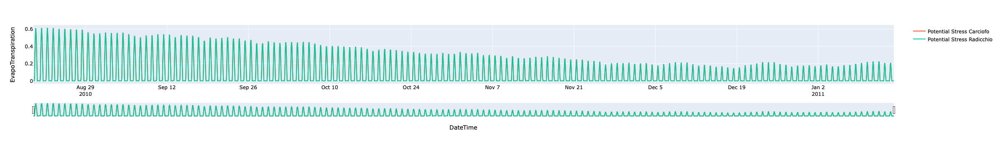

In [3]:
conf_c = pd.read_csv('Carciofo_Potential_Evapotranspiration_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
conf_c.columns = ['Data','Evapo Transpirazione']
conf_r = pd.read_csv('Radicchio_Potential_Evapotranspiration_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
conf_r.columns = ['Data','Evapo Transpirazione']

fig = px.line()
fig.add_trace(go.Scatter(x=conf_c['Data'], y=conf_c['Evapo Transpirazione'], mode='lines', name='Potential Stress Carciofo'))
fig.add_trace(go.Scatter(x=conf_r['Data'], y=conf_r['Evapo Transpirazione'], mode='lines', name='Potential Stress Radicchio'))
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(
    xaxis_title="DateTime",
    font_color="Black",
    title_font_color="Black",
    yaxis_title="EvapoTranspiration",
    font=dict(size=12))
fig.show()

Vengono riportati di seguito gli andamenti di evapotraspirazione considerando invece vari fattori ambientali, più precisamente vengono considerati i seguenti stress:

- Water Stress = stress dovuto al contenuto d'acqua del suolo;
- Environmental stress = dovuto agli stress ambientali, dunque la temperatura, la radiazione solare e il deficit di vapore acqueo;
- Total stress = riguarda la presenza di tutti e quattro gli stress.

Anche in questo caso, ma solamente per quanto riguarda lo stress ambientale, l'andamento per le due piante sarà il medesimo, non dipendendo da fattori intrinsechi delle specie erbacee.

Ciò che varierà tra le due piante sarà invece lo stress dovuto al contenuto d'acqua avendo le due piante due necessità differenti difronte alla risorsa. Questa differenza nell'andamento si ripercuoterà sull'andamento dello stress totale. 

## Radicchio

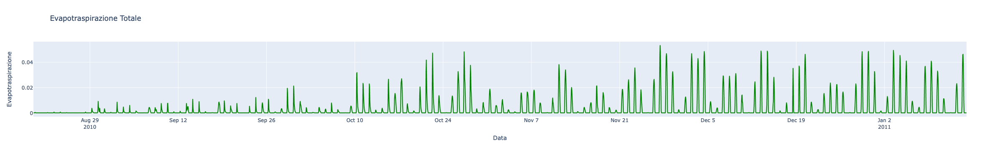

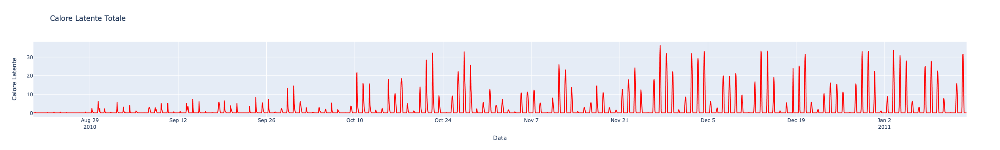

In [4]:
df = pd.read_csv('Radicchio_Total_Evapotranspiration_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df.columns = ['Data','Evapotraspirazione']
fig = px.line(df, x='Data', y='Evapotraspirazione', title='Evapotraspirazione Totale')
fig.update_traces(line_color='green')

fig.show()

df1 = pd.read_csv('Radicchio_Total_LatentHeat_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df1.columns = ['Data','Calore Latente']
fig = px.line(df1, x='Data', y='Calore Latente', title='Calore Latente Totale')
fig.update_traces(line_color='red')

fig.show()

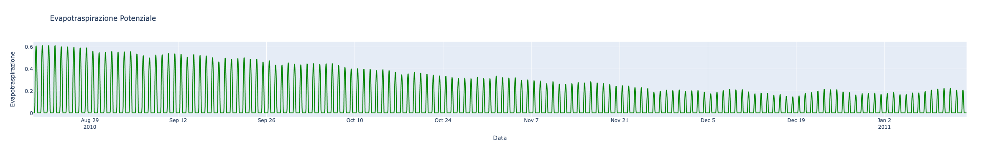

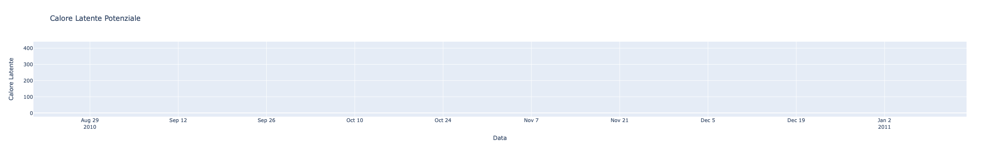

In [5]:
df2 = pd.read_csv('Radicchio_Potential_Evapotranspiration_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df2.columns = ['Data','Evapotraspirazione']
fig = px.line(df2, x='Data', y='Evapotraspirazione', title='Evapotraspirazione Potenziale')
fig.update_traces(line_color='green')

fig.show()

df3 = pd.read_csv('Radicchio_Potential_LatentHeat_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df3.columns = ['Data','Calore Latente']
fig = px.line(df3, x='Data', y='Calore Latente', title='Calore Latente Potenziale')
fig.update_traces(line_color='red')

fig.show()

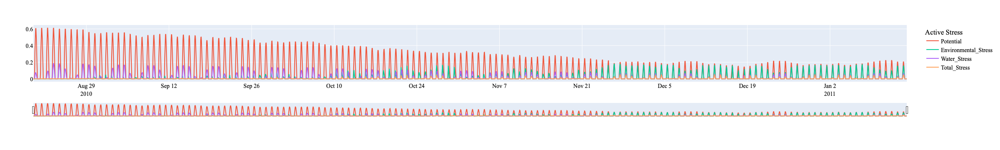

In [6]:
show_stress('Radicchio_Potential_Evapotranspiration_PT_1.csv',
            'Radicchio_Environmental_Evapotranspiration_PT_1.csv',
            'Radicchio_WaterStress_Evapotranspiration_PT_1.csv',
            'Radicchio_Total_Evapotranspiration_PT_1.csv')

## Carciofo

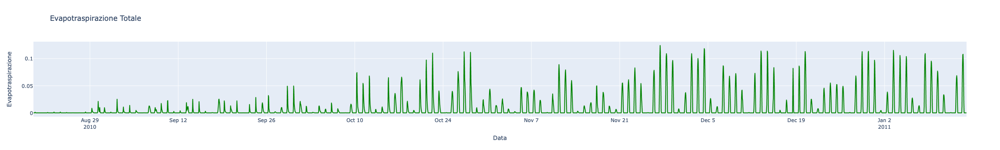

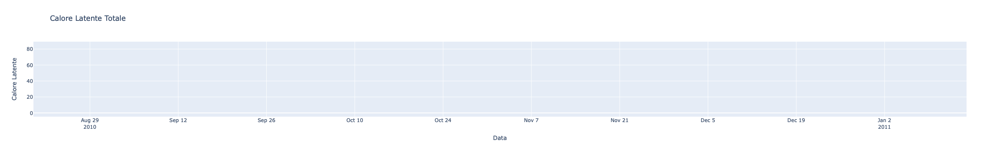

In [7]:
df = pd.read_csv('Carciofo_Total_Evapotranspiration_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df.columns = ['Data','Evapotraspirazione']
fig = px.line(df, x='Data', y='Evapotraspirazione', title='Evapotraspirazione Totale')
fig.update_traces(line_color='green')

fig.show()

df1 = pd.read_csv('Carciofo_Total_LatentHeat_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df1.columns = ['Data','Calore Latente']
fig = px.line(df1, x='Data', y='Calore Latente', title='Calore Latente Totale')
fig.update_traces(line_color='red')

fig.show()

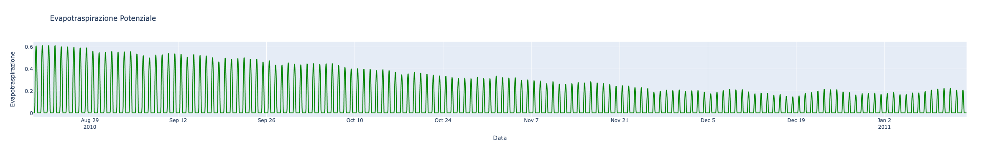

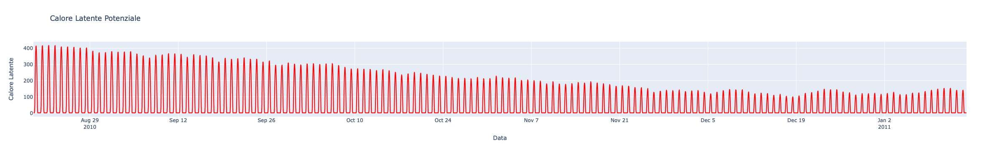

In [8]:
df2 = pd.read_csv('Carciofo_Potential_Evapotranspiration_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df2.columns = ['Data','Evapotraspirazione']
fig = px.line(df2, x='Data', y='Evapotraspirazione', title='Evapotraspirazione Potenziale')
fig.update_traces(line_color='green')

fig.show()

df3 = pd.read_csv('Carciofo_Potential_LatentHeat_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
df3.columns = ['Data','Calore Latente']
fig = px.line(df3, x='Data', y='Calore Latente', title='Calore Latente Potenziale')
fig.update_traces(line_color='red')

fig.show()

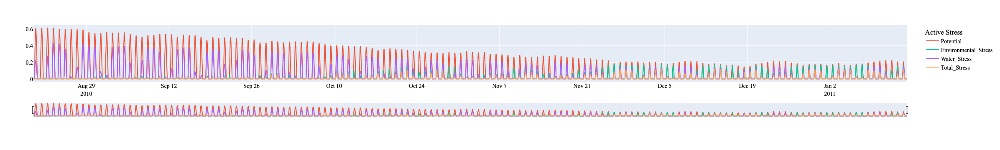

In [9]:
show_stress('Carciofo_Potential_Evapotranspiration_PT_1.csv',
            'Carciofo_Environmental_Evapotranspiration_PT_1.csv',
            'Carciofo_WaterStress_Evapotranspiration_PT_1.csv',
            'Carciofo_Total_Evapotranspiration_PT_1.csv')

## **Confronto**

## Confronto Evapotraspirazione Totale

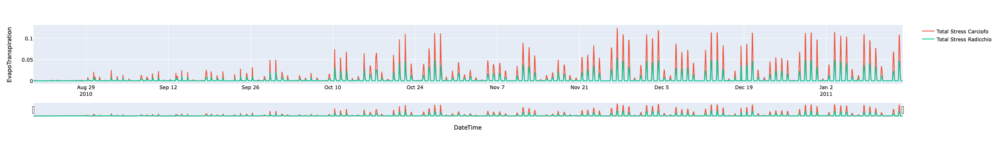

In [10]:
conf_c = pd.read_csv('Carciofo_Total_Evapotranspiration_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
conf_c.columns = ['Data','Evapo Transpirazione']
conf_r = pd.read_csv('Radicchio_Total_Evapotranspiration_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
conf_r.columns = ['Data','Evapo Transpirazione']

fig = px.line()
fig.add_trace(go.Scatter(x=conf_c['Data'], y=conf_c['Evapo Transpirazione'], mode='lines', name='Total Stress Carciofo'))
fig.add_trace(go.Scatter(x=conf_r['Data'], y=conf_r['Evapo Transpirazione'], mode='lines', name='Total Stress Radicchio'))
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(
    xaxis_title="DateTime",
    font_color="Black",
    title_font_color="Black",
    yaxis_title="EvapoTranspiration",
    font=dict(size=12))
fig.show()

## Confronto Evapotraspirazione Water Stress

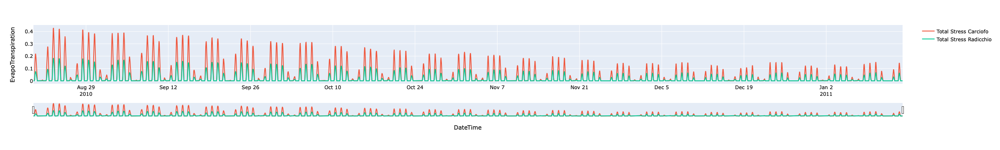

In [11]:
conf_c = pd.read_csv('Carciofo_WaterStress_Evapotranspiration_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
conf_c.columns = ['Data','Evapo Transpirazione']
conf_r = pd.read_csv('Radicchio_WaterStress_Evapotranspiration_PT_1.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
conf_r.columns = ['Data','Evapo Transpirazione']

fig = px.line()
fig.add_trace(go.Scatter(x=conf_c['Data'], y=conf_c['Evapo Transpirazione'], mode='lines', name='Total Stress Carciofo'))
fig.add_trace(go.Scatter(x=conf_r['Data'], y=conf_r['Evapo Transpirazione'], mode='lines', name='Total Stress Radicchio'))
fig.update_xaxes(rangeslider_visible=True)
fig.update_layout(
    xaxis_title="DateTime",
    font_color="Black",
    title_font_color="Black",
    yaxis_title="EvapoTranspiration",
    font=dict(size=12))
fig.show()